# TimeSTAMP Displacement and Velocity Summary Statistics

Summary statistics for displacement and velocity of cerebrospinal fluid (CSF). Displacement of CSF fluid was captured by the TimeSTAMP MRI technique desribed in Borzage et al. (2018), where CSF fluid is tagged axially, allowed to move for 2.5 seconds, and then captured in a final MR image. This allows us to measure the displacement of CSF fluid over 2.5 seconds and thus calculate its velocity at several regions along the spine.

**Stats calculated:**
* Min/max, stddev, and quartiles for displacement
* 95% confidence intervals for the means of flow displacement at each region
* Min/max, stddev, and quartiles for velocity

**Authors:**
* Andrew Roman, andrew.roman@commonspirit.org, aeroman2@asu.edu
* Jakob Perivolotis, jperivol@asu.edu

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy

plt.rcParams['figure.dpi'] = 1200 # Set image resolution

In [2]:
csf_flow_df = pd.read_csv('../../data/CSF_Flow_TimeSTAMP_measurements.csv')
csf_flow_df.head()

,patient_id,age,spinal_region,image_group,image_number,foramen_magnum_distance,super_ante_displacement,infer_ante_displacement,super_post_displacement,infer_post_displacement,super_ante_width,infer_ante_width,super_post_width,infer_post_width,ante_qual_direction,post_qual_direction,image_quality
0,2,24,C2-3,1,1,NaN,-3.29,-5.02,2.26,-1.067,3.29,4.339,3.65,2.503,caudal,rostral,high
1,2,24,C2-3,1,2,NaN,3.676,1.808,1.804,0,5.348,4.391,3.04,2.45,rostral,rostral,high
2,2,24,C2-3,1,3,NaN,-4.33,-9.174,0.8,-4.159,4.099,4.015,2.879,2.042,caudal,caudal,high
3,2,24,C2-3,1,4,NaN,1.194,0,1.717,0,4.207,4.192,3.1,3.385,rostral,rostral,high
4,2,24,C2-3,1,5,NaN,2.585,2.58,1.173,0,4.541,4.4,3.058,2.364,rostral,rostral,high


### Set ID, quality-related, and other columns to Pandas' Categorical type

In [3]:
csf_flow_df['patient_id'] = pd.Categorical(csf_flow_df['patient_id'])
csf_flow_df['image_number'] = pd.Categorical(csf_flow_df['image_number'])
csf_flow_df['ante_qual_direction'] = pd.Categorical(csf_flow_df['ante_qual_direction'])
csf_flow_df['post_qual_direction'] = pd.Categorical(csf_flow_df['post_qual_direction'])

quality_order = ['unreadable', 'low', 'medium', 'high']
csf_flow_df['image_quality'] = pd.Categorical(csf_flow_df['image_quality'],
                                                categories=quality_order,
                                                ordered=True
                                               )

spinal_region_order = ['C2-3', 'C5-6', 'C7-T1', 'T1', 'T1-2', 'T3-4', 'T6-7']
csf_flow_df['spinal_region'] = pd.Categorical(csf_flow_df['spinal_region'],
                                                categories=spinal_region_order,
                                                ordered=True
                                               )

### Set measurement columns to floats

In [4]:
numeric_columns = ['super_ante_displacement', 'infer_ante_displacement', 'super_post_displacement', 'infer_post_displacement',
                   'super_ante_width', 'infer_ante_width', 'super_post_width', 'infer_post_width']
csf_flow_df[numeric_columns] = csf_flow_df[numeric_columns].apply(pd.to_numeric, errors='coerce')
csf_flow_df.dtypes

patient_id                 category
age                           int64
spinal_region              category
image_group                   int64
image_number               category
foramen_magnum_distance     float64
super_ante_displacement     float64
infer_ante_displacement     float64
super_post_displacement     float64
infer_post_displacement     float64
super_ante_width            float64
infer_ante_width            float64
super_post_width            float64
infer_post_width            float64
ante_qual_direction        category
post_qual_direction        category
image_quality              category
dtype: object

### Check for NaN displacement values

In [5]:
csf_flow_df['super_ante_displacement'].isna().value_counts()

super_ante_displacement
False    1036
True      164
Name: count, dtype: int64

In [6]:
csf_flow_df['super_post_displacement'].isna().value_counts()

super_post_displacement
False    1045
True      155
Name: count, dtype: int64

In [7]:
csf_flow_df['infer_ante_displacement'].isna().value_counts()

infer_ante_displacement
False    1037
True      163
Name: count, dtype: int64

In [8]:
csf_flow_df['infer_post_displacement'].isna().value_counts()

infer_post_displacement
False    1041
True      159
Name: count, dtype: int64

### Create absolute value columns for displacement

In [9]:
csf_flow_df['super_ante_displacement_absolute'] = csf_flow_df['super_ante_displacement'].abs()
csf_flow_df['infer_ante_displacement_absolute'] = csf_flow_df['infer_ante_displacement'].abs()
csf_flow_df['super_post_displacement_absolute'] = csf_flow_df['super_post_displacement'].abs()
csf_flow_df['infer_post_displacement_absolute'] = csf_flow_df['infer_post_displacement'].abs()

# Common Functions and Variables

In [10]:
def get_csf_flow_by_patient_id_and_region(df, patient_id, spinal_region):
    # Get data from one of the CSF flow dataframes for one patient in one vertebral region (`C2-3`, etc.)
    data = df[(df['patient_id'] == patient_id) & (df['spinal_region'] == spinal_region)]
    return data

def get_csf_flow_by_region(df, region):
    # Get all flows for all patients from one region
    data = df[df['spinal_region'] == region]
    return data

In [11]:
csf_flow_df['anterior_midline_shift'] = (csf_flow_df['super_ante_displacement'] + csf_flow_df['infer_ante_displacement']) / 2
csf_flow_df['posterior_midline_shift'] = (csf_flow_df['super_post_displacement'] + csf_flow_df['infer_post_displacement']) / 2
csf_flow_df.head()

,patient_id,age,spinal_region,image_group,image_number,foramen_magnum_distance,super_ante_displacement,infer_ante_displacement,super_post_displacement,infer_post_displacement,...,infer_post_width,ante_qual_direction,post_qual_direction,image_quality,super_ante_displacement_absolute,infer_ante_displacement_absolute,super_post_displacement_absolute,infer_post_displacement_absolute,anterior_midline_shift,posterior_midline_shift
0,2,24,C2-3,1,1,NaN,-3.290,-5.020,2.260,-1.067,...,2.503,caudal,rostral,high,3.290,5.020,2.260,1.067,-4.1550,0.5965
1,2,24,C2-3,1,2,NaN,3.676,1.808,1.804,0.000,...,2.450,rostral,rostral,high,3.676,1.808,1.804,0.000,2.7420,0.9020
2,2,24,C2-3,1,3,NaN,-4.330,-9.174,0.800,-4.159,...,2.042,caudal,caudal,high,4.330,9.174,0.800,4.159,-6.7520,-1.6795
3,2,24,C2-3,1,4,NaN,1.194,0.000,1.717,0.000,...,3.385,rostral,rostral,high,1.194,0.000,1.717,0.000,0.5970,0.8585
4,2,24,C2-3,1,5,NaN,2.585,2.580,1.173,0.000,...,2.364,rostral,rostral,high,2.585,2.580,1.173,0.000,2.5825,0.5865


# Displacement Values and 95% CIs

In [12]:
def confidence_interval_for_mean(data, confidence=0.95):
    """
    Calculate the confidence interval (defaults to 95%) of the mean a set of data
    """
    degrees_of_freedom = len(data) - 1
    sample_mean = np.mean(data)
    std_err = scipy.stats.sem(data)
    ci = scipy.stats.t.interval(confidence, degrees_of_freedom, 
                                loc=sample_mean, scale=std_err)
    return ci

def one_sample_t_test(sample, population_mean, alpha=0.05):
    # Calculate the T-score
    sample_mean = np.mean(sample)
    sample_std = np.std(sample, ddof=1)
    sample_size = len(sample)
    t_score = (sample_mean - population_mean) / \
        (sample_std / np.sqrt(sample_size))
    
    # Set degrees of freedom
    dof = sample_size - 1

    # Step 3: Identify the appropriate t-distribution
    # No need to explicitly specify degrees of freedom for one-sample t-test in scipy.stats.t

    # Find the p-value (absolute value produces a two-sided T-test)
    p_value = scipy.stats.t.sf(t_score, dof) * 2

    return {
        "t-score": t_score,
        "dof": dof,
        "p_value": p_value,
        "alpha": alpha
    }

In [13]:
# Summary stats for displacement of anterior flow at C2-3
c2_3 = get_csf_flow_by_region(csf_flow_df, 'C2-3')
c2_3_anterior_flow = pd.concat([c2_3['super_ante_displacement'], c2_3['infer_ante_displacement']])
c2_3_anterior_flow.describe()

count    447.000000
mean      -1.725136
std        7.227536
min      -30.370000
25%       -6.157000
50%       -2.361000
75%        3.783500
max       14.870000
dtype: float64

In [14]:
# 95% confidence interval for mean of anterior flow at C2-3
# .dropna() makes sure NaN values are excluded from the calculation
c2_3_anterior_conf_interval = confidence_interval_for_mean(c2_3_anterior_flow.dropna())
c2_3_anterior_conf_interval

(-2.3969747297772868, -1.0532982008714835)

In [15]:
# Run the flow through a T-test as compared to a hypothetical set of flow values 
# whose average displacement is 0
one_sample_t_test(c2_3_anterior_flow.dropna(), population_mean=0, alpha=0.05)

{'t-score': -5.046461385730992,
 'dof': 446,
 'p_value': 1.9999993434450822,
 'alpha': 0.05}

In [16]:
# Summary stats for displacement of posterior flow at C2-3
c2_3 = get_csf_flow_by_region(csf_flow_df, 'C2-3')
c2_3_posterior_flow = pd.concat([c2_3['super_post_displacement'], c2_3['infer_post_displacement']])
c2_3_posterior_flow.describe()

count    430.000000
mean       0.772916
std        4.672795
min      -19.710000
25%        0.000000
50%        0.000000
75%        1.685500
max       14.400000
dtype: float64

In [17]:
# 95% confidence interval for mean of posterior flow at C2-3
# .dropna() makes sure NaN values are excluded from the calculation
c2_3_posterior_conf_interval = confidence_interval_for_mean(c2_3_posterior_flow.dropna())
c2_3_posterior_conf_interval

(0.330004192724856, 1.215828365414679)

In [18]:
# Run the flow through a T-test as compared to a hypothetical set of flow values 
# whose average displacement is 0
one_sample_t_test(c2_3_posterior_flow.dropna(), population_mean=0, alpha=0.05)

{'t-score': 3.429967356150756,
 'dof': 429,
 'p_value': 0.0006620896968540763,
 'alpha': 0.05}

In [19]:
# Summary stats for displacement of anterior flow at C5-6
c5_6 = get_csf_flow_by_region(csf_flow_df, 'C5-6')
c5_6_anterior_flow = pd.concat([c5_6['super_ante_displacement'], c5_6['infer_ante_displacement']])
c5_6_anterior_flow.describe()

count    452.000000
mean      -2.595166
std       10.069531
min      -45.320000
25%       -7.404500
50%        0.000000
75%        0.247000
max       28.510000
dtype: float64

In [20]:
# 95% confidence interval for mean of anterior flow at C5-6
# .dropna() makes sure NaN values are excluded from the calculation
c5_6_anterior_conf_interval = confidence_interval_for_mean(c5_6_anterior_flow.dropna())
c5_6_anterior_conf_interval

(-3.5259633291456955, -1.664368529261384)

In [21]:
# Run the flow through a T-test as compared to a hypothetical set of flow values 
# whose average displacement is 0
one_sample_t_test(c5_6_anterior_flow.dropna(), population_mean=0, alpha=0.05)

{'t-score': -5.479300304400476,
 'dof': 451,
 'p_value': 1.9999999288680708,
 'alpha': 0.05}

In [22]:
# Summary stats for displacement of posterior flow at C5-6
c5_6 = get_csf_flow_by_region(csf_flow_df, 'C5-6')
c5_6_posterior_flow = pd.concat([c5_6['super_post_displacement'], c5_6['infer_post_displacement']])
c5_6_posterior_flow.describe()

count    452.000000
mean       1.386701
std        6.799445
min      -25.430000
25%        0.000000
50%        0.000000
75%        5.846500
max       22.310000
dtype: float64

In [23]:
# 95% confidence interval for mean of poserior flow at C5-6
# .dropna() makes sure NaN values are excluded from the calculation
c5_6_posterior_conf_interval = confidence_interval_for_mean(c5_6_posterior_flow.dropna())
c5_6_posterior_conf_interval

(0.7581808966697308, 2.015221758197526)

In [24]:
# Run the flow through a T-test as compared to a hypothetical set of flow values 
# whose average displacement is 0
one_sample_t_test(c5_6_posterior_flow.dropna(), population_mean=0, alpha=0.05)

{'t-score': 4.335894094270837,
 'dof': 451,
 'p_value': 1.7921226026071896e-05,
 'alpha': 0.05}

In [25]:
# Summary stats for displacement of anterior flow at T1-2
t1_2 = get_csf_flow_by_region(csf_flow_df, 'T1-2')
t1_2_anterior_flow = pd.concat([t1_2['super_ante_displacement'], t1_2['infer_ante_displacement']])
t1_2_anterior_flow.describe()

count    463.000000
mean       0.892968
std        9.999497
min      -28.980000
25%       -5.558000
50%        0.000000
75%        7.279500
max       32.200000
dtype: float64

In [26]:
# 95% confidence interval for mean of anterior flow at T1-2
# .dropna() makes sure NaN values are excluded from the calculation
t1_2_anterior_conf_interval = confidence_interval_for_mean(t1_2_anterior_flow.dropna())
t1_2_anterior_conf_interval

(-0.020251447686130408, 1.8061866528697155)

In [27]:
# Run the flow through a T-test as compared to a hypothetical set of flow values 
# whose average displacement is 0
one_sample_t_test(t1_2_anterior_flow.dropna(), population_mean=0, alpha=0.05)

{'t-score': 1.9215339069693471,
 'dof': 462,
 'p_value': 0.055279300238450894,
 'alpha': 0.05}

In [28]:
# Summary stats for displacement of posterior flow at T1-2
t1_2 = get_csf_flow_by_region(csf_flow_df, 'T1-2')
t1_2_posterior_flow = pd.concat([t1_2['super_post_displacement'], t1_2['infer_post_displacement']])
t1_2_posterior_flow.describe()

count    464.000000
mean       1.063498
std        7.363482
min      -35.120000
25%       -1.363500
50%        0.000000
75%        5.090250
max       31.960000
dtype: float64

In [29]:
# 95% confidence interval for mean of posterior flow at T1-2
# .dropna() makes sure NaN values are excluded from the calculation
t1_2_posterior_conf_interval = confidence_interval_for_mean(t1_2_posterior_flow.dropna())
t1_2_posterior_conf_interval

(0.39174569051417396, 1.735249999140998)

In [30]:
# Run the flow through a T-test as compared to a hypothetical set of flow values 
# whose average displacement is 0
one_sample_t_test(t1_2_posterior_flow.dropna(), population_mean=0, alpha=0.05)

{'t-score': 3.1110887098824027,
 'dof': 463,
 'p_value': 0.0019791501484739842,
 'alpha': 0.05}

In [31]:
# Summary stats for displacement of anterior flow at T3-4
t3_4 = get_csf_flow_by_region(csf_flow_df, 'T3-4')
t3_4_anterior_flow = pd.concat([t3_4['super_ante_displacement'], t3_4['infer_ante_displacement']])
t3_4_anterior_flow.describe()

count    418.000000
mean       0.998620
std        4.664242
min      -14.540000
25%        0.000000
50%        0.000000
75%        0.000000
max       26.160000
dtype: float64

In [32]:
# 95% confidence interval for mean of anterior flow at T3-4
# .dropna() makes sure NaN values are excluded from the calculation
t3_4_anterior_conf_interval = confidence_interval_for_mean(t3_4_anterior_flow.dropna())
t3_4_anterior_conf_interval

(0.5501806111360841, 1.447058623313677)

In [33]:
# Run the flow through a T-test as compared to a hypothetical set of flow values 
# whose average displacement is 0
one_sample_t_test(t3_4_anterior_flow.dropna(), population_mean=0, alpha=0.05)

{'t-score': 4.377308282271129,
 'dof': 417,
 'p_value': 1.5207961709826889e-05,
 'alpha': 0.05}

In [34]:
# Summary stats for displacement of posterior flow at T3-4
t3_4 = get_csf_flow_by_region(csf_flow_df, 'T3-4')
t3_4_posterior_flow = pd.concat([t3_4['super_post_displacement'], t3_4['infer_post_displacement']])
t3_4_posterior_flow.describe()

count    448.000000
mean       1.473335
std       11.164838
min      -30.330000
25%       -3.656500
50%        0.000000
75%        5.094000
max       43.080000
dtype: float64

In [35]:
# 95% confidence interval for mean of posterior flow at T3-4
# .dropna() makes sure NaN values are excluded from the calculation
t3_4_posterior_conf_interval = confidence_interval_for_mean(t3_4_posterior_flow.dropna())
t3_4_posterior_conf_interval

(0.43666849583291323, 2.51000114702423)

In [36]:
# Run the flow through a T-test as compared to a hypothetical set of flow values 
# whose average displacement is 0
one_sample_t_test(t3_4_posterior_flow.dropna(), population_mean=0, alpha=0.05)

{'t-score': 2.7931100849820245,
 'dof': 447,
 'p_value': 0.005444529274097523,
 'alpha': 0.05}

In [37]:
# Summary stats for displacement of anterior flow at T6-7
t6_7 = get_csf_flow_by_region(csf_flow_df, 'T6-7')
t6_7_anterior_flow = pd.concat([t6_7['super_ante_displacement'], t6_7['infer_ante_displacement']])
t6_7_anterior_flow.describe()

count    245.000000
mean       0.226743
std        1.691353
min       -8.097000
25%        0.000000
50%        0.000000
75%        0.000000
max       11.190000
dtype: float64

In [38]:
# 95% confidence interval for mean of anterior flow at T6-7
# .dropna() makes sure NaN values are excluded from the calculation
t6_7_anterior_conf_interval = confidence_interval_for_mean(t6_7_anterior_flow.dropna())
t6_7_anterior_conf_interval

(0.013900101637187662, 0.4395856126485266)

In [39]:
# Run the flow through a T-test as compared to a hypothetical set of flow values 
# whose average displacement is 0
one_sample_t_test(t6_7_anterior_flow.dropna(), population_mean=0, alpha=0.05)

{'t-score': 2.0983712231970055,
 'dof': 244,
 'p_value': 0.036900799590714746,
 'alpha': 0.05}

In [40]:
# Summary stats for displacement of posterior flow at T6-7
t6_7 = get_csf_flow_by_region(csf_flow_df, 'T6-7')
t6_7_posterior_flow = pd.concat([t6_7['super_post_displacement'], t6_7['infer_post_displacement']])
t6_7_posterior_flow.describe()

count    244.000000
mean       2.113250
std        8.302534
min      -18.690000
25%       -1.160750
50%        0.000000
75%        5.721250
max       32.820000
dtype: float64

In [41]:
# 95% confidence interval for mean of posterior flow at T6-7
# .dropna() makes sure NaN values are excluded from the calculation
t6_7_posterior_conf_interval = confidence_interval_for_mean(t6_7_posterior_flow.dropna())
t6_7_posterior_conf_interval

(1.066284869609984, 3.1602151303900166)

In [42]:
# Run the flow through a T-test as compared to a hypothetical set of flow values 
# whose average displacement is 0
one_sample_t_test(t6_7_posterior_flow.dropna(), population_mean=0, alpha=0.05)

{'t-score': 3.975897210237628,
 'dof': 243,
 'p_value': 9.251911297423434e-05,
 'alpha': 0.05}

### Redo summary stats using absolute values of displacement

In [43]:
# Summary stats using absolute values of displacement of anterior flow at C2-3
c2_3 = get_csf_flow_by_region(csf_flow_df, 'C2-3')
c2_3_anterior_flow_abs = pd.concat([c2_3['super_ante_displacement_absolute'], c2_3['infer_ante_displacement_absolute']])
c2_3_anterior_flow_abs.describe()

count    447.000000
mean       5.964403
std        4.423368
min        0.000000
25%        2.833500
50%        5.092000
75%        8.024500
max       30.370000
dtype: float64

In [44]:
# Summary stats using absolute values of displacement of posterior flow at C2-3
c2_3 = get_csf_flow_by_region(csf_flow_df, 'C2-3')
c2_3_posterior_flow_abs = pd.concat([c2_3['super_post_displacement_absolute'], c2_3['infer_post_displacement_absolute']])
c2_3_posterior_flow_abs.describe()

count    430.000000
mean       2.778944
std        3.833180
min        0.000000
25%        0.000000
50%        0.000000
75%        5.149250
max       19.710000
dtype: float64

In [45]:
# Summary stats using absolute values of displacement of anterior flow at C5-6
c5_6 = get_csf_flow_by_region(csf_flow_df, 'C5-6')
c5_6_anterior_flow_abs = pd.concat([c5_6['super_ante_displacement_absolute'], c5_6['infer_ante_displacement_absolute']])
c5_6_anterior_flow_abs.describe()

count    452.000000
mean       6.697184
std        7.949437
min        0.000000
25%        0.000000
50%        4.380500
75%        9.978250
max       45.320000
dtype: float64

In [46]:
# Summary stats using absolute values of displacement of posterior flow at C5-6
c5_6 = get_csf_flow_by_region(csf_flow_df, 'C5-6')
c5_6_posterior_flow_abs = pd.concat([c5_6['super_post_displacement_absolute'], c5_6['infer_post_displacement_absolute']])
c5_6_posterior_flow_abs.describe()

count    452.000000
mean       4.630617
std        5.164252
min        0.000000
25%        0.000000
50%        3.134500
75%        7.260000
max       25.430000
dtype: float64

In [47]:
# Summary stats using absolute value of displacement of anterior flow at T1-2
t1_2 = get_csf_flow_by_region(csf_flow_df, 'T1-2')
t1_2_anterior_flow_abs = pd.concat([t1_2['super_ante_displacement_absolute'], t1_2['infer_ante_displacement_absolute']])
t1_2_anterior_flow_abs.describe()

count    463.000000
mean       7.695888
std        6.436938
min        0.000000
25%        2.963000
50%        6.174000
75%       11.435000
max       32.200000
dtype: float64

In [48]:
# Summary stats using absolute value of displacement of posterior flow at T1-2
t1_2 = get_csf_flow_by_region(csf_flow_df, 'T1-2')
t1_2_posterior_flow_abs = pd.concat([t1_2['super_post_displacement_absolute'], t1_2['infer_post_displacement_absolute']])
t1_2_posterior_flow_abs.describe()

count    464.000000
mean       4.748403
std        5.723487
min        0.000000
25%        0.000000
50%        3.427500
75%        7.789750
max       35.120000
dtype: float64

In [49]:
# Summary stats using absolute value of displacement of anterior flow at T3-4
t3_4 = get_csf_flow_by_region(csf_flow_df, 'T3-4')
t3_4_anterior_flow_abs = pd.concat([t3_4['super_ante_displacement_absolute'], t3_4['infer_ante_displacement_absolute']])
t3_4_anterior_flow_abs.describe()

count    418.000000
mean       2.150294
std        4.256752
min        0.000000
25%        0.000000
50%        0.000000
75%        2.935750
max       26.160000
dtype: float64

In [50]:
# Summary stats using absolute value of displacement of posterior flow at T3-4
t3_4 = get_csf_flow_by_region(csf_flow_df, 'T3-4')
t3_4_posterior_flow_abs = pd.concat([t3_4['super_post_displacement_absolute'], t3_4['infer_post_displacement_absolute']])
t3_4_posterior_flow_abs.describe()

count    448.000000
mean       7.150080
std        8.694317
min        0.000000
25%        0.628500
50%        4.275500
75%        9.892000
max       43.080000
dtype: float64

In [51]:
# Summary stats using absolute value of displacement of anterior flow at T6-7
t6_7 = get_csf_flow_by_region(csf_flow_df, 'T6-7')
t6_7_anterior_flow_abs = pd.concat([t6_7['super_ante_displacement_absolute'], t6_7['infer_ante_displacement_absolute']])
t6_7_anterior_flow_abs.describe()

count    245.000000
mean       0.511812
std        1.627659
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max       11.190000
dtype: float64

In [52]:
# Summary stats using absolute value of displacement of posterior flow at T6-7
t6_7 = get_csf_flow_by_region(csf_flow_df, 'T6-7')
t6_7_posterior_flow_abs = pd.concat([t6_7['super_post_displacement_absolute'], t6_7['infer_post_displacement_absolute']])
t6_7_posterior_flow_abs.describe()

count    244.000000
mean       5.403594
std        6.640578
min        0.000000
25%        0.000000
50%        2.618500
75%        9.387250
max       32.820000
dtype: float64

### Summary of Displacement Values

In [53]:
all_abs_displacements = pd.concat([csf_flow_df['super_ante_displacement_absolute'],
                                   csf_flow_df['super_post_displacement_absolute'],
                                   csf_flow_df['infer_ante_displacement_absolute'],
                                   csf_flow_df['infer_post_displacement_absolute']
                                  ])

In [54]:
# Absolute maximum flow observed
all_abs_displacements.describe()

count    4159.000000
mean        5.054606
std         6.335680
min         0.000000
25%         0.000000
50%         3.141000
75%         7.707500
max        52.680000
dtype: float64

In [55]:
# Print the row where the maximum flow was observed (which is apparently from one of the obscure T1-vertebra-only images)
csf_flow_df[csf_flow_df['super_post_displacement_absolute'] > 50]

,patient_id,age,spinal_region,image_group,image_number,foramen_magnum_distance,super_ante_displacement,infer_ante_displacement,super_post_displacement,infer_post_displacement,...,infer_post_width,ante_qual_direction,post_qual_direction,image_quality,super_ante_displacement_absolute,infer_ante_displacement_absolute,super_post_displacement_absolute,infer_post_displacement_absolute,anterior_midline_shift,posterior_midline_shift
552,17,23,T1,1,1,NaN,9.564,-5.379,52.68,0.0,...,1.849,bidirectional,rostral,medium,9.564,5.379,52.68,0.0,2.0925,26.34


# Velocity Values

Velocity is displacement divided by 2.5 seconds. The `2.5` seconds value comes from how long of an exposure the TimeSTAMP MRI takes of the CSF fluid. In laymen's terms, the CSF fluid gets tagged, the machine waits 2.5 seconds, then the image is captured.

In [56]:
SECONDS = 2.5

all_abs_velocities = all_abs_displacements / SECONDS
all_abs_velocities.describe()

count    4159.000000
mean        2.021842
std         2.534272
min         0.000000
25%         0.000000
50%         1.256400
75%         3.083000
max        21.072000
dtype: float64

# Scatter and Boxplots of Displacement Measurements

In [57]:
# Drop any `C7-T1` measurements
boxplot_df = csf_flow_df[csf_flow_df['spinal_region'] != 'C7-T1']

# Remove `C7-T1` and `T1` from the official categories, so that they don't get plotted
spinal_region_order = ['C2-3', 'C5-6', 'T1-2', 'T3-4', 'T6-7']
boxplot_df['spinal_region'] = pd.Categorical(boxplot_df['spinal_region'],
                                                categories=spinal_region_order,
                                                ordered=True
                                               )

# Add `T1` measurements into the `T1-2` category
boxplot_df.loc[:, 'spinal_region'].apply(lambda x: 'T1-2' if x == 'T1' else x)

/var/folders/ff/0dllkckn7pd79t2n01pcp8r40000gn/T/ipykernel_22857/610662675.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  boxplot_df['spinal_region'] = pd.Categorical(boxplot_df['spinal_region'],


0       C2-3
1       C2-3
2       C2-3
3       C2-3
4       C2-3
        ... 
1195    T6-7
1196    T6-7
1197    T6-7
1198    T6-7
1199    T6-7
Name: spinal_region, Length: 1192, dtype: category
Categories (5, object): ['C2-3' < 'C5-6' < 'T1-2' < 'T3-4' < 'T6-7']

In [58]:
boxplot_df['spinal_region'].value_counts()

spinal_region
C5-6    256
T1-2    240
C2-3    232
T3-4    224
T6-7    224
Name: count, dtype: int64

In [59]:
boxplot_df

,patient_id,age,spinal_region,image_group,image_number,foramen_magnum_distance,super_ante_displacement,infer_ante_displacement,super_post_displacement,infer_post_displacement,...,infer_post_width,ante_qual_direction,post_qual_direction,image_quality,super_ante_displacement_absolute,infer_ante_displacement_absolute,super_post_displacement_absolute,infer_post_displacement_absolute,anterior_midline_shift,posterior_midline_shift
0,2,24,C2-3,1,1,NaN,-3.290,-5.020,2.260,-1.067,...,2.503,caudal,rostral,high,3.290,5.020,2.260,1.067,-4.1550,0.5965
1,2,24,C2-3,1,2,NaN,3.676,1.808,1.804,0.000,...,2.450,rostral,rostral,high,3.676,1.808,1.804,0.000,2.7420,0.9020
2,2,24,C2-3,1,3,NaN,-4.330,-9.174,0.800,-4.159,...,2.042,caudal,caudal,high,4.330,9.174,0.800,4.159,-6.7520,-1.6795
3,2,24,C2-3,1,4,NaN,1.194,0.000,1.717,0.000,...,3.385,rostral,rostral,high,1.194,0.000,1.717,0.000,0.5970,0.8585
4,2,24,C2-3,1,5,NaN,2.585,2.580,1.173,0.000,...,2.364,rostral,rostral,high,2.585,2.580,1.173,0.000,2.5825,0.5865
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,31,25,T6-7,1,26,NaN,NaN,NaN,NaN,NaN,...,NaN,unreadable,unreadable,unreadable,NaN,NaN,NaN,NaN,NaN,NaN
1196,31,25,T6-7,1,27,NaN,NaN,NaN,NaN,NaN,...,NaN,unreadable,unreadable,unreadable,NaN,NaN,NaN,NaN,NaN,NaN
1197,31,25,T6-7,1,28,NaN,NaN,NaN,NaN,NaN,...,NaN,unreadable,unreadable,unreadable,NaN,NaN,NaN,NaN,NaN,NaN
1198,31,25,T6-7,1,29,NaN,NaN,NaN,NaN,NaN,...,NaN,unreadable,unreadable,unreadable,NaN,NaN,NaN,NaN,NaN,NaN


In [60]:
# Stack the dataframe, so that it is only intervertebral regions and their displacement measurements
# with one row per measurement
a = boxplot_df.loc[:, ['spinal_region', 'super_ante_displacement']].reset_index(drop=True)
b = boxplot_df.loc[:, ['spinal_region', 'super_post_displacement']].reset_index(drop=True)
c = boxplot_df.loc[:, ['spinal_region', 'infer_ante_displacement']].reset_index(drop=True)
d = boxplot_df.loc[:, ['spinal_region', 'infer_post_displacement']].reset_index(drop=True)

# Rename columns
new_columns = ['spinal_region', 'displacement']
a.columns = new_columns
b.columns = new_columns
c.columns = new_columns
d.columns = new_columns

# Stack columns
all_displacements_df = pd.concat([a, b, c, d],
                                 axis=0,
                                 ignore_index=True)
all_displacements_df

,spinal_region,displacement
0,C2-3,-3.290
1,C2-3,3.676
2,C2-3,-4.330
3,C2-3,1.194
4,C2-3,2.585
...,...,...
4763,T6-7,NaN
4764,T6-7,NaN
4765,T6-7,NaN
4766,T6-7,NaN


In [61]:
all_displacements_df['displacement'].isna().value_counts()

displacement
False    4127
True      641
Name: count, dtype: int64

Text(0, 0.5, 'Displacement (mm)')

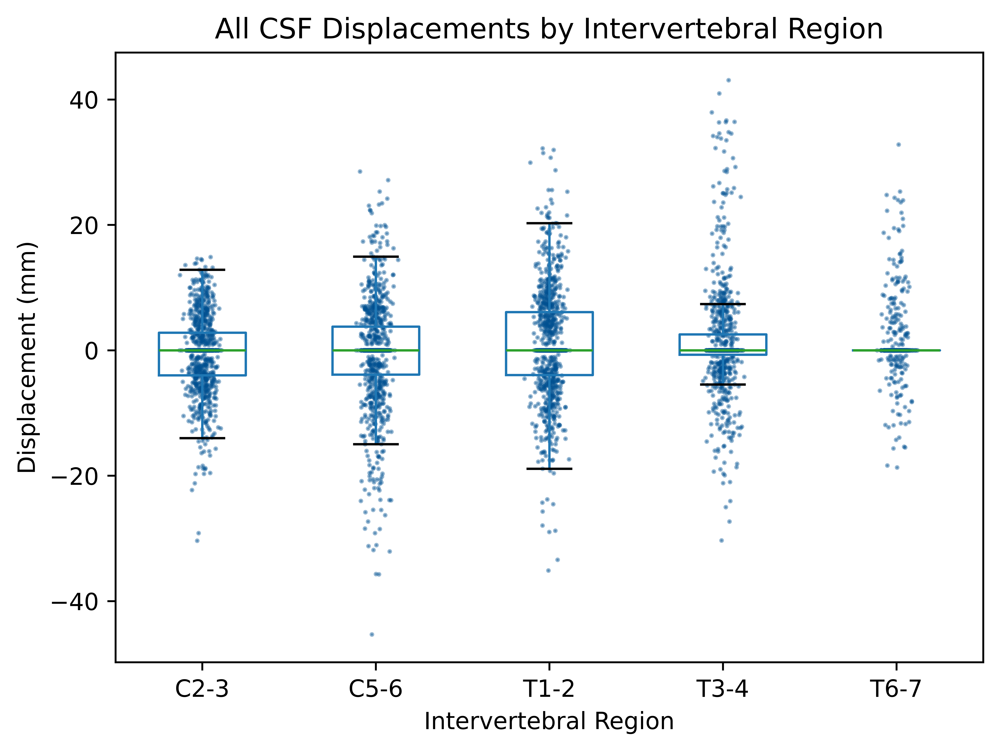

In [62]:
all_displacements_df.boxplot(column='displacement', by='spinal_region', grid=False, showfliers=False)

regions = all_displacements_df['spinal_region'].unique().dropna()
counter = 0
for i in regions:
    measurements = all_displacements_df[all_displacements_df['spinal_region'] == i]['displacement']
    x = np.random.normal(counter + 1, 0.04, len(measurements))
    plt.scatter(x, measurements, s=1, alpha=0.4, c='#005091')
    counter += 1

plt.suptitle('') # Get rid of default boxplot title
plt.title('All CSF Displacements by Intervertebral Region')
plt.xlabel('Intervertebral Region')
plt.ylabel('Displacement (mm)')

## Separate Anterior and Posterior Measurements

In [63]:
anterior_displacements_df = pd.concat([a, c],
                                 axis=0,
                                 ignore_index=True)

posterior_displacements_df = pd.concat([b, d],
                                 axis=0,
                                 ignore_index=True)

In [64]:
anterior_displacements_df

,spinal_region,displacement
0,C2-3,-3.290
1,C2-3,3.676
2,C2-3,-4.330
3,C2-3,1.194
4,C2-3,2.585
...,...,...
2379,T6-7,NaN
2380,T6-7,NaN
2381,T6-7,NaN
2382,T6-7,NaN


In [65]:
posterior_displacements_df

,spinal_region,displacement
0,C2-3,2.260
1,C2-3,1.804
2,C2-3,0.800
3,C2-3,1.717
4,C2-3,1.173
...,...,...
2379,T6-7,NaN
2380,T6-7,NaN
2381,T6-7,NaN
2382,T6-7,NaN


In [66]:
anterior_displacements_df['displacement'].isna().value_counts()

displacement
False    2057
True      327
Name: count, dtype: int64

In [67]:
posterior_displacements_df['displacement'].isna().value_counts()

displacement
False    2070
True      314
Name: count, dtype: int64

Text(0, 0.5, 'Displacement (mm)')

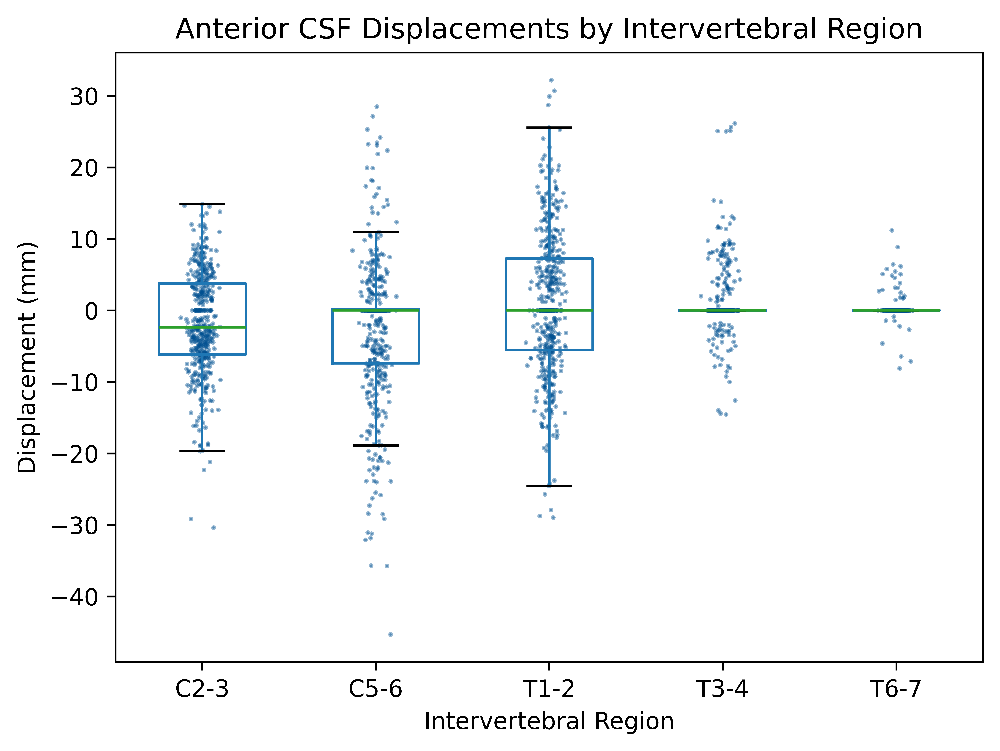

In [68]:
anterior_displacements_df.boxplot(column='displacement', by='spinal_region', grid=False, showfliers=False)

regions = anterior_displacements_df['spinal_region'].unique().dropna()
counter = 0
for i in regions:
    measurements = anterior_displacements_df[anterior_displacements_df['spinal_region'] == i]['displacement']
    x = np.random.normal(counter + 1, 0.04, len(measurements))
    plt.scatter(x, measurements, s=1, alpha=0.4, c='#005091')
    counter += 1

plt.suptitle('') # Get rid of default boxplot title
plt.title('Anterior CSF Displacements by Intervertebral Region')
plt.xlabel('Intervertebral Region')
plt.ylabel('Displacement (mm)')

Text(0, 0.5, 'Displacement (mm)')

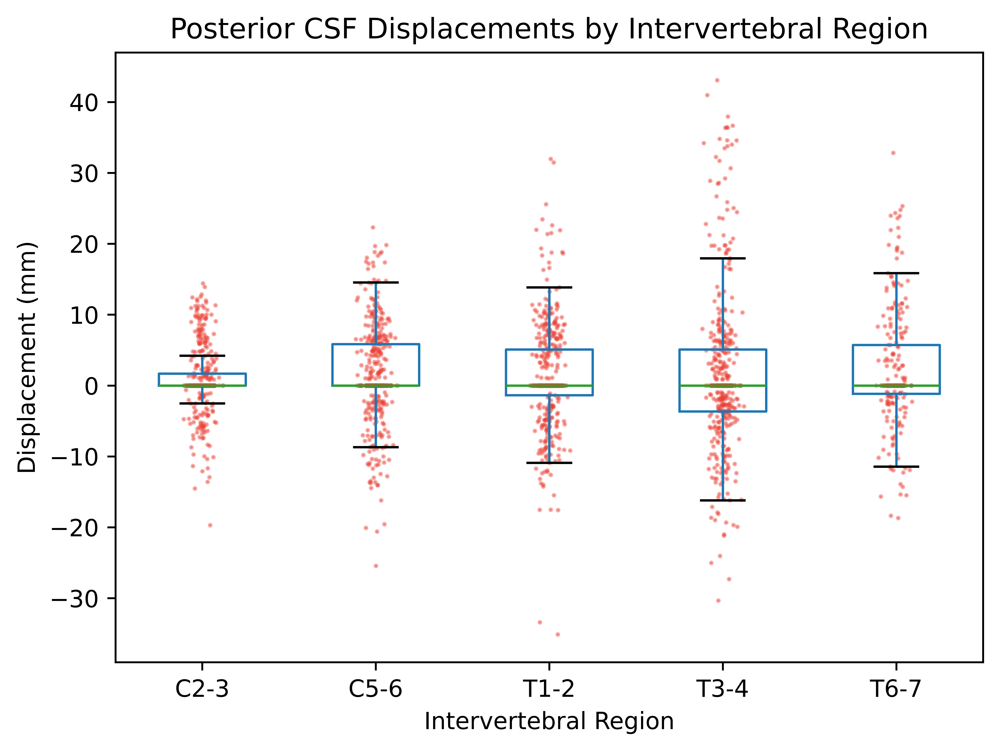

In [69]:
posterior_displacements_df.boxplot(column='displacement', by='spinal_region', grid=False, showfliers=False)

regions = posterior_displacements_df['spinal_region'].unique().dropna()
counter = 0
for i in regions:
    measurements = posterior_displacements_df[posterior_displacements_df['spinal_region'] == i]['displacement']
    x = np.random.normal(counter + 1, 0.04, len(measurements))
    plt.scatter(x, measurements, s=1, alpha=0.4, c='#eb4034')
    counter += 1

plt.suptitle('') # Get rid of default boxplot title
plt.title('Posterior CSF Displacements by Intervertebral Region')
plt.xlabel('Intervertebral Region')
plt.ylabel('Displacement (mm)')

/var/folders/ff/0dllkckn7pd79t2n01pcp8r40000gn/T/ipykernel_22857/224962262.py:5: UserWarning: When passing multiple axes, sharex and sharey are ignored. These settings must be specified when creating axes.
  posterior_displacements_df.boxplot(column='displacement', by='spinal_region',


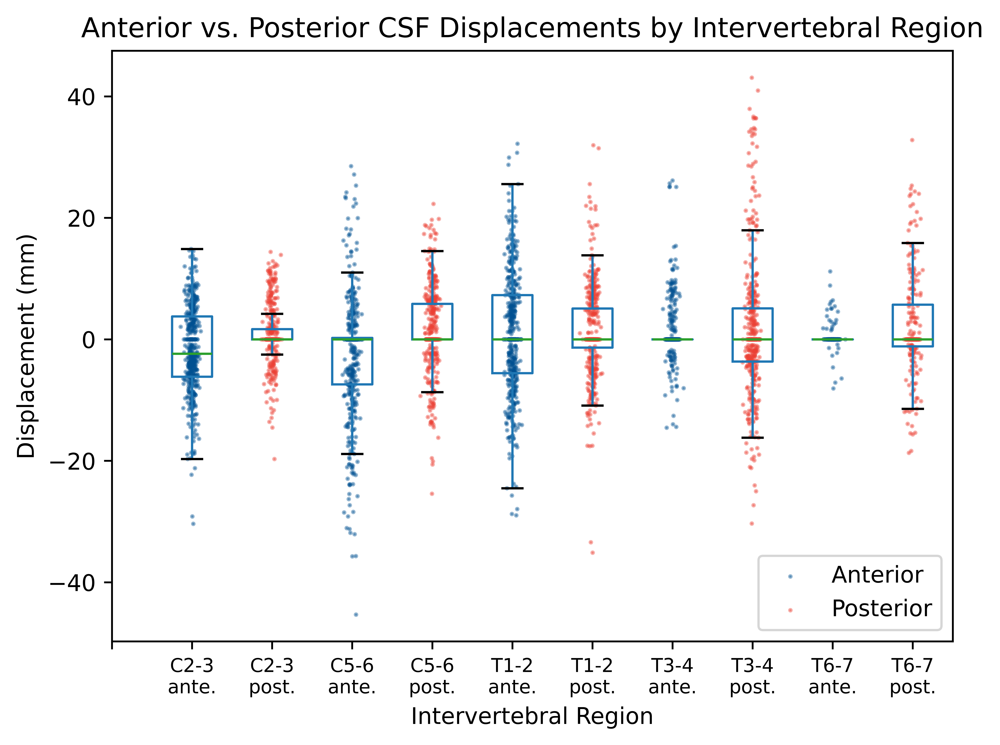

In [70]:
# Create a boxplot that combines the anterior and posterior boxplots using the same `ax`
ax = anterior_displacements_df.boxplot(column='displacement', by='spinal_region', 
                                        grid=False, showfliers=False, return_type='axes',
                                        positions=[1,3,5,7,9])
posterior_displacements_df.boxplot(column='displacement', by='spinal_region',
                                  grid=False, showfliers=False, ax=ax, 
                                  positions=[2,4,6,8,10])

ante_regions = posterior_displacements_df['spinal_region'].unique().dropna()
counter = 0
for i in ante_regions:
    # Plot anterior measurements as dots
    ante_measurements = anterior_displacements_df[anterior_displacements_df['spinal_region'] == i]['displacement']
    x = np.random.normal(counter + 1, 0.04, len(ante_measurements))
    plt.scatter(x, ante_measurements, s=1, alpha=0.4, c='#005091', label='Anterior')
    counter += 2

post_regions = posterior_displacements_df['spinal_region'].unique().dropna()
counter = 1
for i in post_regions:
    # Plot posterior measurements as dots
    post_measurements = posterior_displacements_df[posterior_displacements_df['spinal_region'] == i]['displacement']
    x = np.random.normal(counter + 1, 0.04, len(post_measurements))
    plt.scatter(x, post_measurements, s=1, alpha=0.4, c='#eb4034', label='Posterior')
    counter += 2

plt.suptitle('') # Get rid of default boxplot title
plt.title('Anterior vs. Posterior CSF Displacements by Intervertebral Region')
plt.xlabel('Intervertebral Region')
plt.ylabel('Displacement (mm)')
plt.xticks(ticks=range(11), size='small',
           labels=['', 'C2-3\nante.', 'C2-3\npost.',
                   'C5-6\nante.', 'C5-6\npost.',
                   'T1-2\nante.', 'T1-2\npost.',
                   'T3-4\nante.', 'T3-4\npost.',
                   'T6-7\nante.', 'T6-7\npost.',
                  ]
          )
# Add legend and deduplicate its labels
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc='lower right')

/var/folders/ff/0dllkckn7pd79t2n01pcp8r40000gn/T/ipykernel_22857/2858039552.py:7: UserWarning: When passing multiple axes, sharex and sharey are ignored. These settings must be specified when creating axes.
  posterior_displacements_df.boxplot(column='displacement', by='spinal_region',


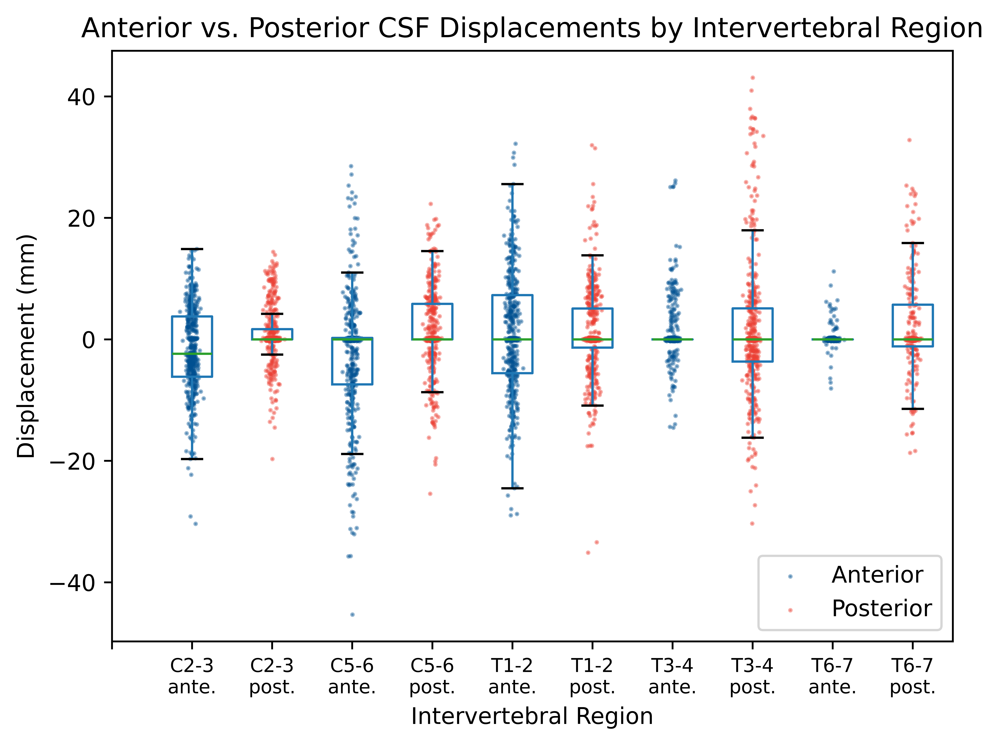

In [71]:
import random

# Create a boxplot that combines the anterior and posterior boxplots using the same `ax`
ax = anterior_displacements_df.boxplot(column='displacement', by='spinal_region', 
                                        grid=False, showfliers=False, return_type='axes',
                                        positions=[1,3,5,7,9])
posterior_displacements_df.boxplot(column='displacement', by='spinal_region',
                                  grid=False, showfliers=False, ax=ax, 
                                  positions=[2,4,6,8,10])

ante_regions = posterior_displacements_df['spinal_region'].unique().dropna()
counter = 0
for i in ante_regions:
    # Plot anterior measurements as dots
    ante_measurements = anterior_displacements_df[anterior_displacements_df['spinal_region'] == i]['displacement']
   
    # Add y-axis jitter for displacements that equal 0, so they don't overlap too much
    temp = []
    for m in ante_measurements:
        if m == 0:
            m += random.randrange(-30, 30) / 100
        temp.append(m)
    ante_measurements = temp
    
    x = np.random.normal(counter + 1, 0.04, len(ante_measurements))
    plt.scatter(x, ante_measurements, s=1, alpha=0.4, c='#005091', label='Anterior')
    counter += 2

post_regions = posterior_displacements_df['spinal_region'].unique().dropna()
counter = 1
for i in post_regions:
    # Plot posterior measurements as dots
    post_measurements = posterior_displacements_df[posterior_displacements_df['spinal_region'] == i]['displacement']

    # Add y-axis jitter for displacements that equal 0, so they don't overlap too much
    temp = []
    for m in post_measurements:
        if m == 0:
            m += random.randrange(-30, 30) / 100
        temp.append(m)
    post_measurements = temp
    
    x = np.random.normal(counter + 1, 0.04, len(post_measurements))
    plt.scatter(x, post_measurements, s=1, alpha=0.4, c='#eb4034', label='Posterior')
    counter += 2

plt.suptitle('') # Get rid of default boxplot title
plt.title('Anterior vs. Posterior CSF Displacements by Intervertebral Region')
plt.xlabel('Intervertebral Region')
plt.ylabel('Displacement (mm)')
plt.xticks(ticks=range(11), size='small',
           labels=['', 'C2-3\nante.', 'C2-3\npost.',
                   'C5-6\nante.', 'C5-6\npost.',
                   'T1-2\nante.', 'T1-2\npost.',
                   'T3-4\nante.', 'T3-4\npost.',
                   'T6-7\nante.', 'T6-7\npost.',
                  ]
          )
# Add legend and deduplicate its labels
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc='lower right')

### Count how many measurements were equal to zero for each intervertebral region

In [72]:
c2_3_anterior_zeros = anterior_displacements_df[(anterior_displacements_df['spinal_region'] == 'C2-3') & (anterior_displacements_df['displacement'] == 0)]
c2_3_anterior_zeros.count()

spinal_region    26
displacement     26
dtype: int64

In [73]:
c2_3_posterior_zeros = posterior_displacements_df[(posterior_displacements_df['spinal_region'] == 'C2-3') & (posterior_displacements_df['displacement'] == 0)]
c2_3_posterior_zeros.count()

spinal_region    222
displacement     222
dtype: int64

In [74]:
c5_6_anterior_zeros = anterior_displacements_df[(anterior_displacements_df['spinal_region'] == 'C5-6') & (anterior_displacements_df['displacement'] == 0)]
c5_6_anterior_zeros.count()

spinal_region    154
displacement     154
dtype: int64

In [75]:
c5_6_posterior_zeros = posterior_displacements_df[(posterior_displacements_df['spinal_region'] == 'C5-6') & (posterior_displacements_df['displacement'] == 0)]
c5_6_posterior_zeros.count()

spinal_region    168
displacement     168
dtype: int64

In [76]:
t1_2_anterior_zeros = anterior_displacements_df[(anterior_displacements_df['spinal_region'] == 'T1-2') & (anterior_displacements_df['displacement'] == 0)]
t1_2_anterior_zeros.count()

spinal_region    69
displacement     69
dtype: int64

In [77]:
t1_2_posterior_zeros = posterior_displacements_df[(posterior_displacements_df['spinal_region'] == 'T1-2') & (posterior_displacements_df['displacement'] == 0)]
t1_2_posterior_zeros.count()

spinal_region    189
displacement     189
dtype: int64

In [78]:
t3_4_anterior_zeros = anterior_displacements_df[(anterior_displacements_df['spinal_region'] == 'T3-4') & (anterior_displacements_df['displacement'] == 0)]
t3_4_anterior_zeros.count()

spinal_region    287
displacement     287
dtype: int64

In [79]:
t3_4_posterior_zeros = posterior_displacements_df[(posterior_displacements_df['spinal_region'] == 'T3-4') & (posterior_displacements_df['displacement'] == 0)]
t3_4_posterior_zeros.count()

spinal_region    112
displacement     112
dtype: int64

In [80]:
t6_7_anterior_zeros = anterior_displacements_df[(anterior_displacements_df['spinal_region'] == 'T6-7') & (anterior_displacements_df['displacement'] == 0)]
t6_7_anterior_zeros.count()

spinal_region    215
displacement     215
dtype: int64

In [81]:
t6_7_posterior_zeros = posterior_displacements_df[(posterior_displacements_df['spinal_region'] == 'T6-7') & (posterior_displacements_df['displacement'] == 0)]
t6_7_posterior_zeros.count()

spinal_region    89
displacement     89
dtype: int64